# The gym chain Model Fitness

The gym chain Model Fitness is developing a customer interaction strategy based on analytical data.
In order to fight churn, Model Fitness has digitized a number of its customer profiles. Your task is to analyze them and come up with a customer retention strategy.<br>
<br>
The purpose of this project to answer the following question:<br>
What is the most outstanding groups and and what there main features?<br>
whitch factors that impact churn most?<br><br>

Also we will give recommendations on how to improve customer service:<br>
1.Identify target groups<br>
2.Suggest measures to cut churn<br>
3.Describe any other patterns you see with respect to interaction with customers<br>


## Initialization

In [1]:
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
%pip install ydata-profiling
from ydata_profiling import ProfileReport
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from sklearn.tree import plot_tree
%pip install scikit-learn
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans
import plotly.express as px
%matplotlib inline


Note: you may need to restart the kernel to use updated packages.



## Load data

In [2]:
try:
    gym = pd.read_csv('/datasets/gym_churn_us.csv')
except:
    gym = pd.read_csv(r'C:\Users\Alar\Downloads\gym_churn_us.csv')
print(gym.shape)

(4000, 14)


In [3]:
gym.head()

,gender,Near_Location,Partner,Promo_friends,Phone,Contract_period,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn
0,1,1,1,1,0,6,1,29,14.227470,5.0,3,0.020398,0.000000,0
1,0,1,0,0,1,12,1,31,113.202938,12.0,7,1.922936,1.910244,0
2,0,1,1,0,1,1,0,28,129.448479,1.0,2,1.859098,1.736502,0
3,0,1,1,1,1,12,1,33,62.669863,12.0,2,3.205633,3.357215,0
4,1,1,1,1,1,1,0,26,198.362265,1.0,3,1.113884,1.120078,0


## Carry out exploratory data analysis (EDA)

### Look at the dataset: does it contain any missing features?

In [4]:
gym.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 14 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   gender                             4000 non-null   int64  
 1   Near_Location                      4000 non-null   int64  
 2   Partner                            4000 non-null   int64  
 3   Promo_friends                      4000 non-null   int64  
 4   Phone                              4000 non-null   int64  
 5   Contract_period                    4000 non-null   int64  
 6   Group_visits                       4000 non-null   int64  
 7   Age                                4000 non-null   int64  
 8   Avg_additional_charges_total       4000 non-null   float64
 9   Month_to_end_contract              4000 non-null   float64
 10  Lifetime                           4000 non-null   int64  
 11  Avg_class_frequency_total          4000 non-null   float

In [5]:
profile = ProfileReport(gym, title = 'panada profiling report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
gym.duplicated().sum()

0

we have 14 features most of them are int ( they have 2 values 1 / 0) and other features are float (averages and month to end contract). also we noted that the data is not contain any date data so it's not based on date.<br> <br>
from the correlation part we can mark a strong corellation:<br>
Month_to_end_contract is highly overall correlated with Contract_period <br>
Avg_class_frequency_total is highly overall correlated with Avg_class_frequency_current_month <br>
Avg_class_frequency_current_month is highly overall correlated with Avg_class_frequency_total <br>
Contract_period is highly overall correlated with Month_to_end_contract <br> <br>
and there are no duplicates 
<br>

### Study the mean values and standard deviation (use the describe() method).


In [7]:
gym.describe()

,gender,Near_Location,Partner,Promo_friends,Phone,Contract_period,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn
count,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000
mean,0.510250,0.845250,0.486750,0.308500,0.903500,4.681250,0.412250,29.184250,146.943728,4.322750,3.724750,1.879020,1.767052,0.265250
std,0.499957,0.361711,0.499887,0.461932,0.295313,4.549706,0.492301,3.258367,96.355602,4.191297,3.749267,0.972245,1.052906,0.441521
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,18.000000,0.148205,1.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,27.000000,68.868830,1.000000,1.000000,1.180875,0.963003,0.000000
50%,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,29.000000,136.220159,1.000000,3.000000,1.832768,1.719574,0.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,6.000000,1.000000,31.000000,210.949625,6.000000,5.000000,2.536078,2.510336,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,12.000000,1.000000,41.000000,552.590740,12.000000,31.000000,6.023668,6.146783,1.000000


### Look at the mean feature values in two groups: for those who left (churn) and for those who stayed (use the groupby() method).

In [8]:
gym_grouped = gym.groupby(['Churn'])['gender','Near_Location','Partner','Promo_friends','Phone','Contract_period','Group_visits','Age','Avg_additional_charges_total','Month_to_end_contract','Lifetime','Avg_class_frequency_total','Avg_class_frequency_current_month'].mean()
gym_grouped

C:\Users\Alar\AppData\Local\Temp\ipykernel_14188\1489102335.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  gym_grouped = gym.groupby(['Churn'])['gender','Near_Location','Partner','Promo_friends','Phone','Contract_period','Group_visits','Age','Avg_additional_charges_total','Month_to_end_contract','Lifetime','Avg_class_frequency_total','Avg_class_frequency_current_month'].mean()


,gender,Near_Location,Partner,Promo_friends,Phone,Contract_period,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month
Churn,,,,,,,,,,,,,
0,0.510037,0.873086,0.534195,0.353522,0.903709,5.747193,0.464103,29.976523,158.445715,5.283089,4.711807,2.024876,2.027882
1,0.510839,0.768143,0.355325,0.183789,0.902922,1.728558,0.268615,26.989632,115.082899,1.662582,0.990575,1.474995,1.044546


we can see that the data is distributed equally between the two genders, we have 50% males and females. also, we can see that 0.87 of our customers live/ work near the gym.<b>
also the major of our partner is employees in partner companies who have discounts, and those who left us and are not employees from partner companies. that mean those who has deal are more likely to stay a member of our gym.<br>
in the contract period we can see those who are a members are using a long time contract, and who left the gym were assigned to short contract from the first place.<br>


### Plot bar histograms and feature distributions for those who left (churn) and those who stayed

for those who stayed and left:


<AxesSubplot:xlabel='gender', ylabel='Count'>

<AxesSubplot:xlabel='gender', ylabel='Count'>

Text(0.5, 1.0, 'gender')

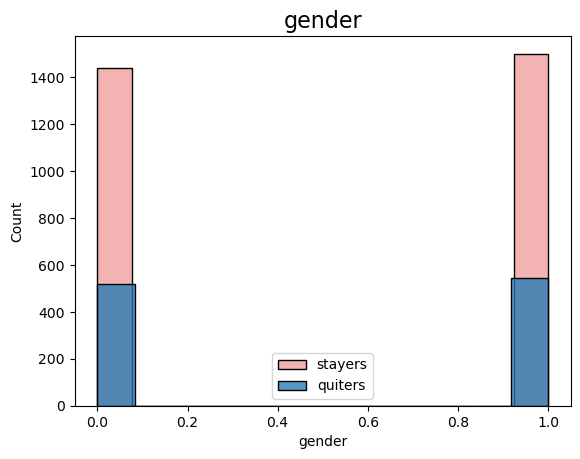

<AxesSubplot:xlabel='Near_Location', ylabel='Count'>

<AxesSubplot:xlabel='Near_Location', ylabel='Count'>

Text(0.5, 1.0, 'Near_Location')

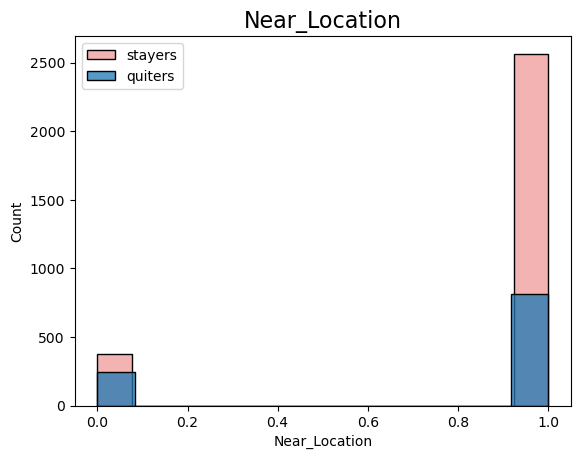

<AxesSubplot:xlabel='Partner', ylabel='Count'>

<AxesSubplot:xlabel='Partner', ylabel='Count'>

Text(0.5, 1.0, 'Partner')

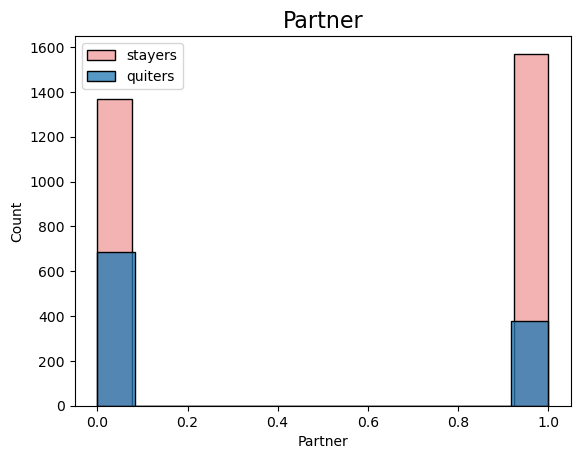

<AxesSubplot:xlabel='Promo_friends', ylabel='Count'>

<AxesSubplot:xlabel='Promo_friends', ylabel='Count'>

Text(0.5, 1.0, 'Promo_friends')

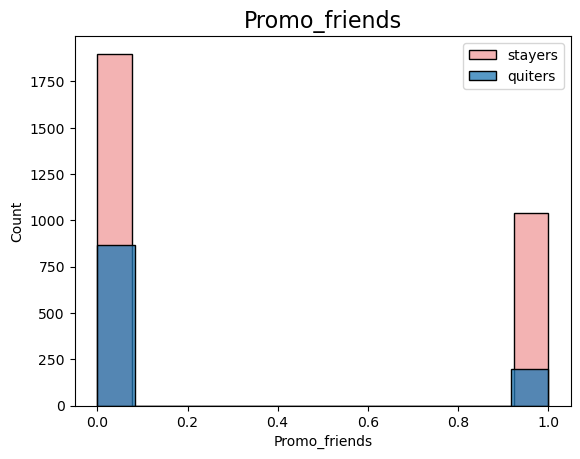

<AxesSubplot:xlabel='Phone', ylabel='Count'>

<AxesSubplot:xlabel='Phone', ylabel='Count'>

Text(0.5, 1.0, 'Phone')

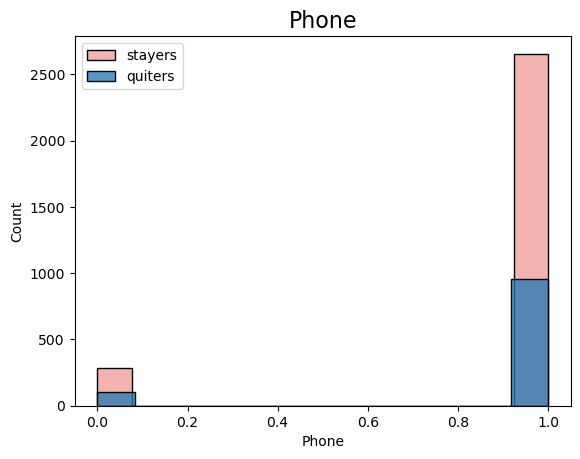

<AxesSubplot:xlabel='Contract_period', ylabel='Count'>

<AxesSubplot:xlabel='Contract_period', ylabel='Count'>

Text(0.5, 1.0, 'Contract_period')

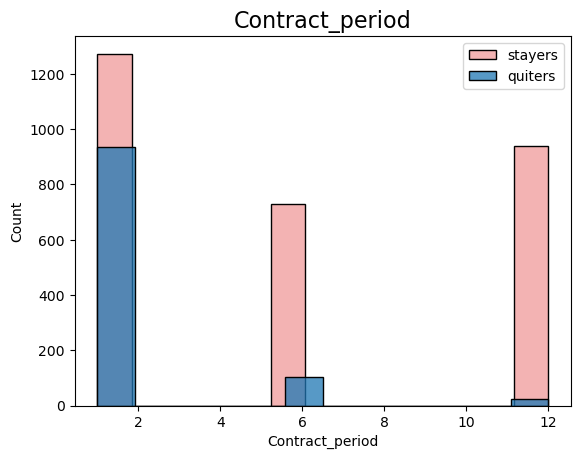

<AxesSubplot:xlabel='Group_visits', ylabel='Count'>

<AxesSubplot:xlabel='Group_visits', ylabel='Count'>

Text(0.5, 1.0, 'Group_visits')

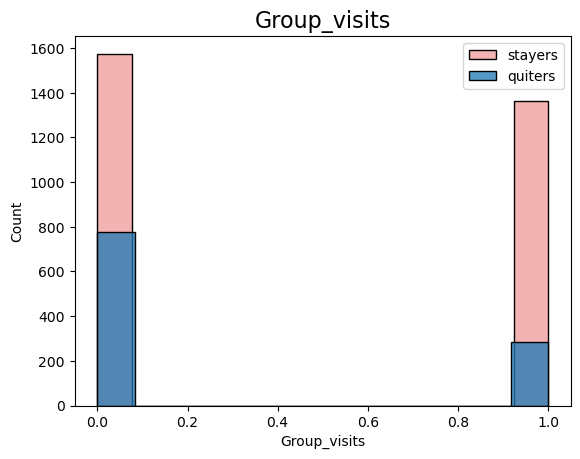

<AxesSubplot:xlabel='Age', ylabel='Count'>

<AxesSubplot:xlabel='Age', ylabel='Count'>

Text(0.5, 1.0, 'Age')

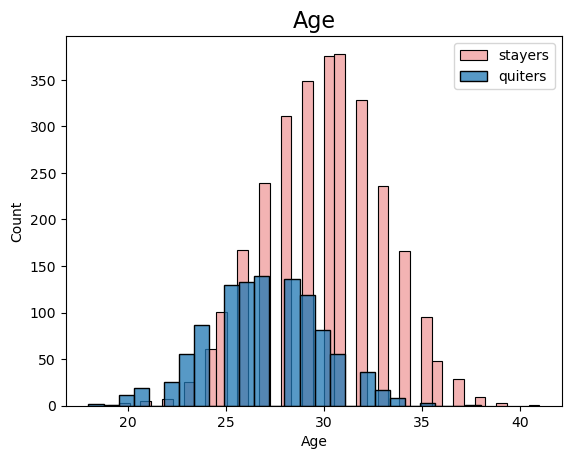

<AxesSubplot:xlabel='Avg_additional_charges_total', ylabel='Count'>

<AxesSubplot:xlabel='Avg_additional_charges_total', ylabel='Count'>

Text(0.5, 1.0, 'Avg_additional_charges_total')

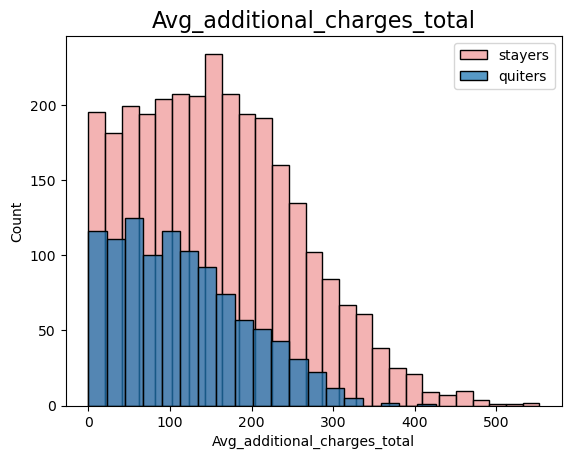

<AxesSubplot:xlabel='Month_to_end_contract', ylabel='Count'>

<AxesSubplot:xlabel='Month_to_end_contract', ylabel='Count'>

Text(0.5, 1.0, 'Month_to_end_contract')

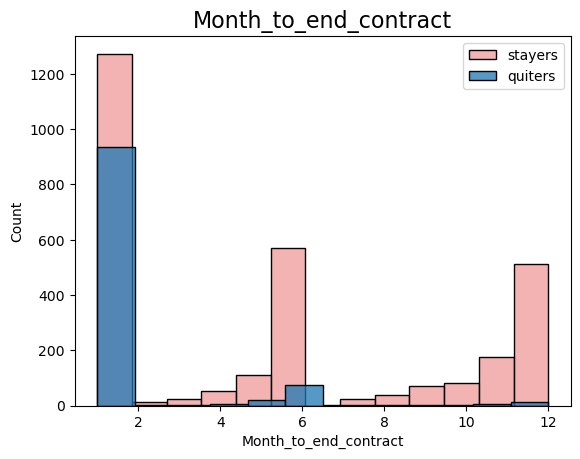

<AxesSubplot:xlabel='Lifetime', ylabel='Count'>

<AxesSubplot:xlabel='Lifetime', ylabel='Count'>

Text(0.5, 1.0, 'Lifetime')

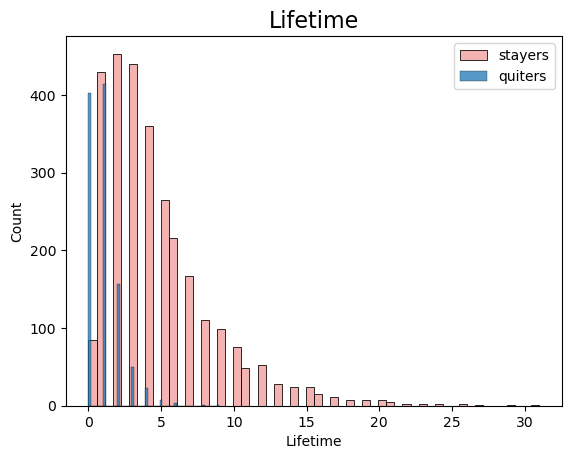

<AxesSubplot:xlabel='Avg_class_frequency_total', ylabel='Count'>

<AxesSubplot:xlabel='Avg_class_frequency_total', ylabel='Count'>

Text(0.5, 1.0, 'Avg_class_frequency_total')

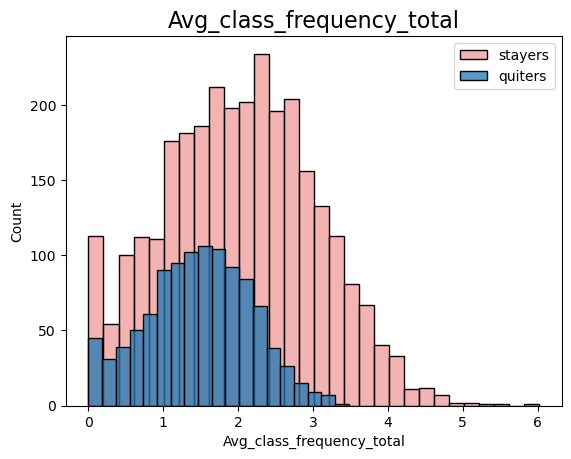

<AxesSubplot:xlabel='Avg_class_frequency_current_month', ylabel='Count'>

<AxesSubplot:xlabel='Avg_class_frequency_current_month', ylabel='Count'>

Text(0.5, 1.0, 'Avg_class_frequency_current_month')

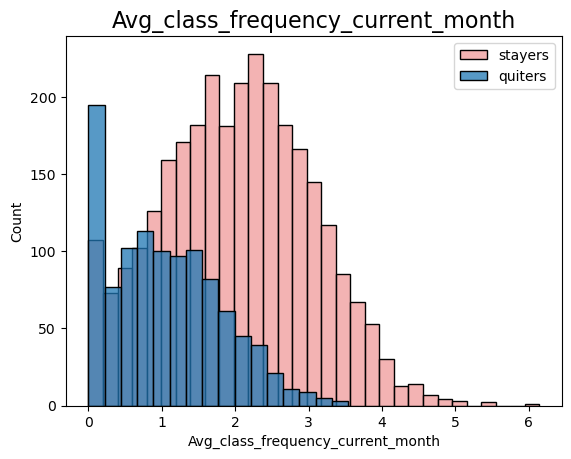

In [9]:
gym_churn_stay = gym.loc[gym['Churn'] == 0]
gym_churn_quit = gym.loc[gym['Churn'] == 1]

print('for those who stayed and left:')
for col in gym.drop('Churn', axis=1).columns:
    sns.histplot(gym_churn_stay[col],label='stayers',color='#EF9A9A')
    sns.histplot(gym_churn_quit[col],label='quiters')
    plt.title(col, fontsize=16)
    plt.legend()
    plt.show()

**we split the data to stayed customers and quitters:<br>
in the gender graph we can see that the data is distributed equally between female and male stayers and quiters.<br>
in the near location graph as we saw before stayers are work or live in the area where the gym located.<br>
the other graphs are also similar for what we saw.<br>
in the age graph we can see that the distribution for stayers around the age of 30 which is more positive that the quitters.**


### Build a correlation matrix and display it.


In [10]:
# correlation matrix
corr_m = gym.corr()

<AxesSubplot:>

(15.0, 0.0)

Text(0.5, 1.0, 'correlation matrix')

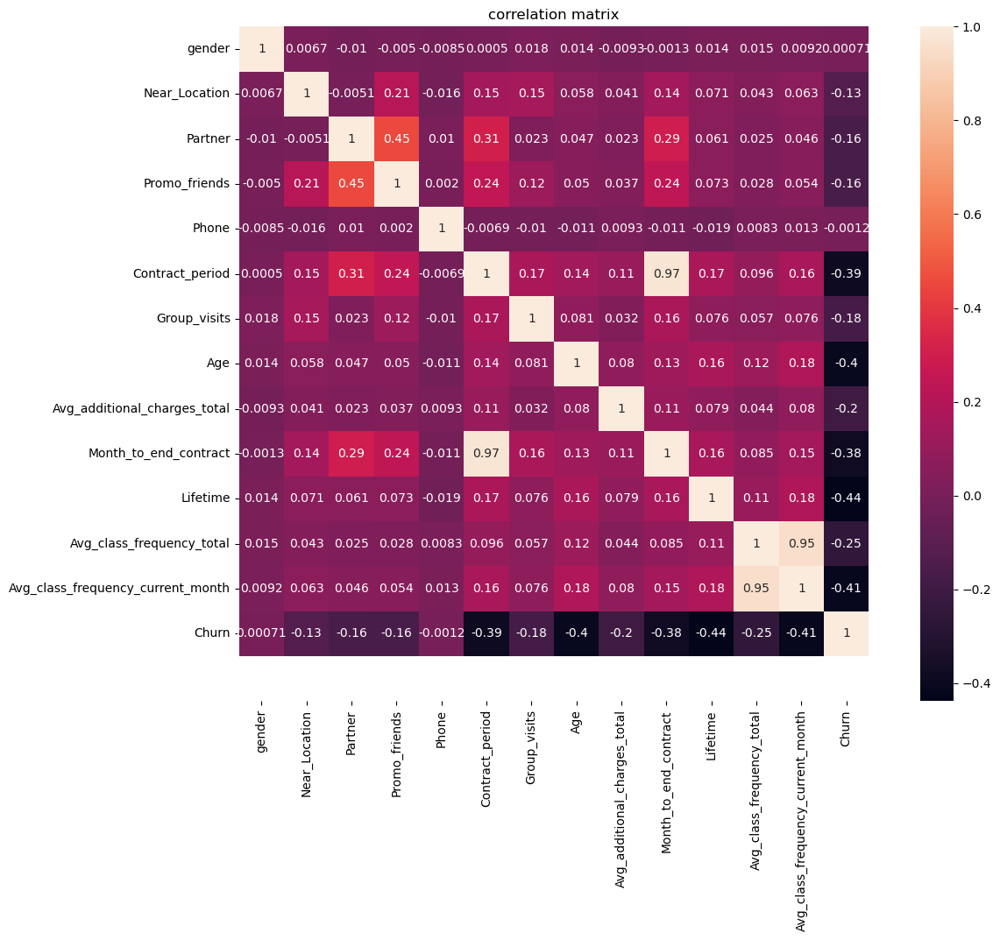

In [11]:
# plot a heatmap
fig, ax = plt.subplots(figsize = (15,10))
sns.heatmap(corr_m,square = True,annot = True)
ax.set_ylim(15,0)
ax.set_title('correlation matrix')
plt.show()

**in the correlation matrix we can see a strong 
Avg_class_frequency_total correlated with Avg_class_frequency_current_month about 0.95  <br>
Avg_class_frequency_current_month is correlated with Avg_class_frequency_total also 0.95 <br>
Contract_period is highly overall correlated with Month_to_end_contract about 0.97 <br> 
also we can see a correlation between partner and promo_frinds 0.45 meaning frinds from the same work place came to train in the same gym.
as we can see we have 2 feature who has high correlation between them, Contract_period and Month_to_end_contract I choose to drop these feature to prevent any effect on the model**

In [12]:
gym_new = gym.drop(['Contract_period','Month_to_end_contract'], axis=1)
gym_new.head()

,gender,Near_Location,Partner,Promo_friends,Phone,Group_visits,Age,Avg_additional_charges_total,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn
0,1,1,1,1,0,1,29,14.227470,3,0.020398,0.000000,0
1,0,1,0,0,1,1,31,113.202938,7,1.922936,1.910244,0
2,0,1,1,0,1,0,28,129.448479,2,1.859098,1.736502,0
3,0,1,1,1,1,1,33,62.669863,2,3.205633,3.357215,0
4,1,1,1,1,1,0,26,198.362265,3,1.113884,1.120078,0


## Build a model to predict user churn

Here the model must identify a relationship between the objects' features and the target variable value, users leaving next month 

Let's take the 4000 observations and divide them into two unequal parts, We'll pass the first part to the model and train the algorithm on them. Then we'll use the model to predict the answers for the second part of the data and compare the results with the real target values. This will allow us to fine-tune the model.

In [13]:
# divide the data into features (the X matrix) and a target variable (y)
X = gym_new.drop('Churn', axis = 1)
y = gym_new['Churn']

In [14]:
# divide the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [15]:
# create a StandardScaler object and apply it to train set
scaler = StandardScaler()
scaler.fit(X_train)
X_train_st = scaler.transform(X_train) # train the scaler and transform the matrix for train set

StandardScaler()

In [16]:
# apply standardization to the feature matrix for test set
X_test_st = scaler.transform(X_test)

### Train the model on the train set with two methods:


**Logistic Regression** :

In [17]:
# define the list of the models
model_1 = LogisticRegression(random_state=0)
# train your model
model_1.fit(X, y)
# use the trained model to make forecasts
predictions_1 = model_1.predict(X_test)
probabilities_1 = model_1.predict_proba(X_test)[:,1]
# the function that calculates MAPE
def mape(y_test, y_pred):
    y_error = y_test - y_pred
    y_error_abs = [abs(i) for i in y_error]
    perc_error_abs = y_error_abs / y_test
    mape = (perc_error_abs.sum() / len(y_test))
    return mape


# the function that takes the model and data on input and outputs metrics
def print_all_metrics(y_true, y_pred, y_proba, title= 'Matrics'):
    print('Accuracy: {:.2f}'.format(accuracy_score(y_true, y_pred)))
    print('Precision: {:.2f}'.format(precision_score(y_true, y_pred)))
    print('Recall: {:.2f}'.format(recall_score(y_true, y_pred)))
    print('F1: {:.2f}'.format(f1_score(y_true, y_pred)))
    print('ROC_AUC: {:.2f}'.format(roc_auc_score(y_true, y_proba)))
    print('MAE:{:.2f} MSE:{:.2f} MAPE:{:.2f} R2:{:.2f} '.format(mean_absolute_error(y_true, y_pred),
                                                                mean_squared_error(y_true, y_pred),
                                                                mape(y_true, y_pred),
                                                                r2_score(y_true, y_pred)))
    
# print all metrics
print_all_metrics(y_test, predictions_1, probabilities_1 ,title = 'Metrics for LogisticRegression:')



C:\Users\Alar\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

Accuracy: 0.91
Precision: 0.86
Recall: 0.75
F1: 0.80
ROC_AUC: 0.94
MAE:0.09 MSE:0.09 MAPE:inf R2:0.50 


In [18]:
# Create lists
column_labels = X.columns.tolist()
coef = model_1.coef_.squeeze().tolist()

# Zip together
labels_coef = list(zip(column_labels, coef))

# Verify the result
print(labels_coef)

[('gender', -0.0590178961647992), ('Near_Location', 0.09562059666709052), ('Partner', -0.5133818872105579), ('Promo_friends', -0.7608244222575837), ('Phone', 1.5545206965317804), ('Group_visits', -0.6787263590689797), ('Age', -0.0996435541628715), ('Avg_additional_charges_total', -0.0039299293155645116), ('Lifetime', -0.9298612751456716), ('Avg_class_frequency_total', 4.484912227403939), ('Avg_class_frequency_current_month', -5.1339795802101085)]


**Random forest**:

In [19]:
#define the new model's algorithm based on the decision tree
rf_model = RandomForestClassifier(n_estimators = 100, random_state =0)

# train the random forest model
rf_model.fit(X_train_st, y_train)

#use che trained model co make predictions
rf_predictions = rf_model.predict(X_test_st)
rf_probabilities = rf_model.predict_proba(X_test_st)[:,1]

# print all metries
print_all_metrics(y_test, rf_predictions, rf_probabilities, title= 'Metrics for Random Forest Classifier:')


RandomForestClassifier(random_state=0)

Accuracy: 0.92
Precision: 0.85
Recall: 0.81
F1: 0.83
ROC_AUC: 0.96
MAE:0.08 MSE:0.08 MAPE:inf R2:0.55 


feature_weights_2 = rf_model.feature_importances_
feature_weights_2

RandomForestClassifier()

[0.02019587 0.0172027  0.02208345 0.01923866 0.01102523 0.02692515
 0.17930014 0.16204067 0.34442932 0.19755881]


<AxesSubplot:>

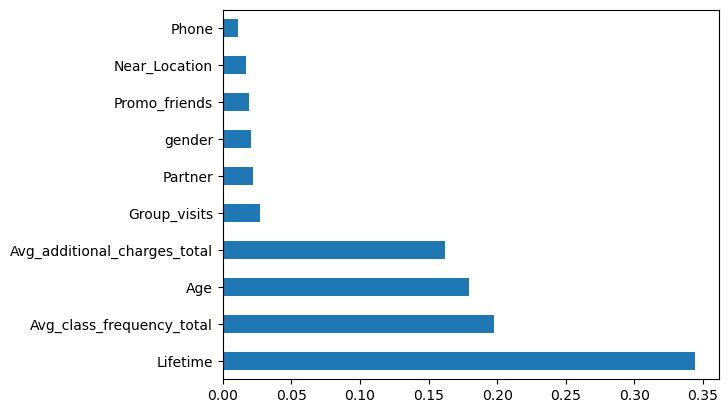

In [20]:
X = gym_new.iloc[:,0:10]  #independent columns
y = gym_new.iloc[:,11]    #target column 
model = RandomForestClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

conclosion: 
RandomForestClassifier model made correct prediction for more than 90%  of the answers, also for Precision and Recall Matrics the model performce in a better way than LogisticRegression model.<br>
in addition, the average absolute difference between the predicted values and the actual values for RandomForestClassifier is more close to zero than LogisticRegression. also r2 for RandomForestClassifier is showing a high level of correlation.
in model RandomForestClassifier we can see  high score for avg additional charges, age, avg class frequency and lifetime and that mean they have a strong impact on the model's prediction

## Create user clusters

### Set aside the column with data on churn and identify object (user) clusters:

Standardization will transform the values so that they form a standard normal distribution: the mean will be 0, and their standard deviation will be 1

In [21]:
scaler = StandardScaler() # creating a scaler class object (normalizer)
x_sc = scaler.fit_transform(X)

In [22]:
linked = linkage(x_sc, method = 'ward') 

### Use the linkage() function to build a matrix of distances based on the standardized feature matrix and plot a dendrogram. Note: rendering the dendrogram may take time! Use the resulting graph to estimate the number of clusters you can single out.

<Figure size 1500x1000 with 0 Axes>

{'icoord': [[15.0, 15.0, 25.0, 25.0],
  [35.0, 35.0, 45.0, 45.0],
  [20.0, 20.0, 40.0, 40.0],
  [65.0, 65.0, 75.0, 75.0],
  [55.0, 55.0, 70.0, 70.0],
  [30.0, 30.0, 62.5, 62.5],
  [5.0, 5.0, 46.25, 46.25],
  [85.0, 85.0, 95.0, 95.0],
  [105.0, 105.0, 115.0, 115.0],
  [90.0, 90.0, 110.0, 110.0],
  [125.0, 125.0, 135.0, 135.0],
  [155.0, 155.0, 165.0, 165.0],
  [145.0, 145.0, 160.0, 160.0],
  [130.0, 130.0, 152.5, 152.5],
  [175.0, 175.0, 185.0, 185.0],
  [195.0, 195.0, 205.0, 205.0],
  [180.0, 180.0, 200.0, 200.0],
  [141.25, 141.25, 190.0, 190.0],
  [100.0, 100.0, 165.625, 165.625],
  [25.625, 25.625, 132.8125, 132.8125],
  [215.0, 215.0, 225.0, 225.0],
  [245.0, 245.0, 255.0, 255.0],
  [235.0, 235.0, 250.0, 250.0],
  [275.0, 275.0, 285.0, 285.0],
  [265.0, 265.0, 280.0, 280.0],
  [295.0, 295.0, 305.0, 305.0],
  [335.0, 335.0, 345.0, 345.0],
  [325.0, 325.0, 340.0, 340.0],
  [315.0, 315.0, 332.5, 332.5],
  [300.0, 300.0, 323.75, 323.75],
  [272.5, 272.5, 311.875, 311.875],
  [242.5, 24

Text(0.5, 1.0, 'Hierarchical clustering for GYM')

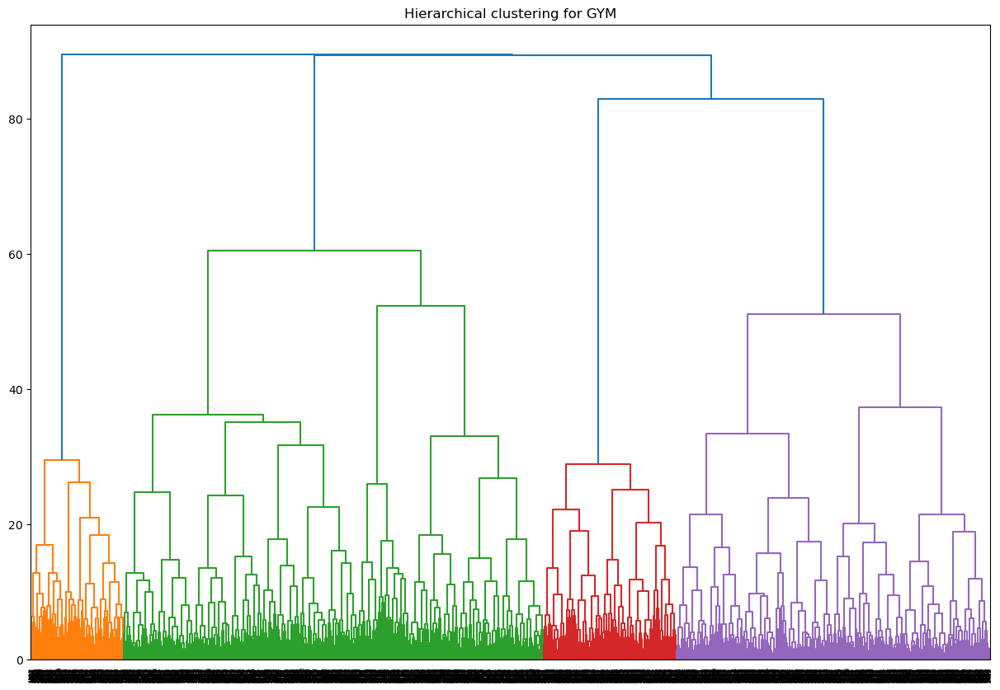

In [23]:
plt.figure(figsize=(15, 10))  
dendrogram(linked, orientation='top')
plt.title('Hierarchical clustering for GYM')
plt.show() 

we can see 4 clusters

### Train the clustering model with the K-means algorithm and predict customer clusters. (Let the number of clusters be n=5, so that it'll be easier to compare your results with those of other students. However, in real life, no one will give you such hints, so you'll have to decide based on the graph from the previous step.)

In [24]:
def show_clusters (df, x_name, y_name, cluster_name):
    plt.figure(figsize = (10,10))
    sns.scatterplot(df[x_name],df[y_name],
            hue= df[cluster_name],paltte='paired')
    plt.title('{} vs {}'.format(x_name, y_name))
    plt.show()
    
km = KMeans(n_clusters = 5, random_state = 0) # setting the number of clusters as 5
labels = km.fit_predict(x_sc) # applying the algorithm to the data and forming a cluster vector

# store cluster labels in the field of our dataset
gym_new['cluster_km'] = labels

gym_new.head()

,gender,Near_Location,Partner,Promo_friends,Phone,Group_visits,Age,Avg_additional_charges_total,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn,cluster_km
0,1,1,1,1,0,1,29,14.227470,3,0.020398,0.000000,0,4
1,0,1,0,0,1,1,31,113.202938,7,1.922936,1.910244,0,2
2,0,1,1,0,1,0,28,129.448479,2,1.859098,1.736502,0,3
3,0,1,1,1,1,1,33,62.669863,2,3.205633,3.357215,0,1
4,1,1,1,1,1,0,26,198.362265,3,1.113884,1.120078,0,1


### Look at the mean feature values for clusters. Does anything catch your eye?

In [25]:
# get the statistics of the mean feature values per cluster
gym_new_clusters =  gym_new.groupby(['cluster_km']).mean()
gym_new_clusters

,gender,Near_Location,Partner,Promo_friends,Phone,Group_visits,Age,Avg_additional_charges_total,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn
cluster_km,,,,,,,,,,,,
0,0.501773,0.000000,0.492908,0.083333,1.0,0.235816,28.728723,137.122143,3.053191,1.776146,1.611292,0.398936
1,0.498058,0.999029,0.860194,1.000000,1.0,0.517476,29.469903,150.970147,4.174757,1.924965,1.866963,0.145631
2,0.588050,0.998952,0.335430,0.013627,1.0,0.581761,31.053459,179.717637,5.286164,2.374847,2.353537,0.048218
3,0.452158,1.000000,0.263602,0.024390,1.0,0.246717,27.435272,119.909745,2.169794,1.454306,1.243660,0.503752
4,0.523316,0.862694,0.471503,0.305699,0.0,0.427461,29.297927,144.208179,3.940415,1.854211,1.723967,0.266839


cluster number 0 we can see the feature mear location is 0 which means they are not live/works close to the gym most of them don't have promo_friends and They have 3 months lifetime <br> 
cluster number 1 all of them came to the gym with promo_friend also they have a high mean in group_visit. Hence, they look like they went with a group to train in the gym, and we can see the avg charges of 150.9 which is a respectful amount of money and relatively they have a low percentage of customer churn.<br>
cluster number 2 shows interesting values, they live/ work near the gym most of them are not employees in partner companies also they prefer group visits and they are older customers with age 31 - and they have high average charges of 179.
also, they have the longest lifetime 5.2 months, and the most important they have the lowest Churn mean 0.04 <br>
cluster number 3 has the highest Churn mean of 0.50, Unsurprisingly they have a low average lifetime 2.1 months

### Plot distributions of features for the clusters. Do you notice anything?

In [26]:
categorical_var = gym_new[['gender','Near_Location', 'Partner', 'Promo_friends','Phone', 'Group_visits', 'Churn', 'cluster_km',]]
numric_var = gym_new[['Age','Avg_additional_charges_total','Lifetime','Avg_class_frequency_total','Avg_class_frequency_current_month','cluster_km']]

In [27]:
for i in numric_var.columns:
    px.box(x= numric_var['cluster_km'], y=numric_var[i], title=i)

**according to the boxplot above :
in feature age cluster number 2 has the highest median number 31 and cluster 3 has the lowest median age 27 <br>
in feature avg additional charges total cluster number 2 has the higest median 170 and cluster number 3 has the lowest median 106 <br>
in lifetime feature :cluster 2 has median of 4 and cluster number 4 tend to leave after 1 month <br>
in avg class frequency total we also see cluster number 3 with median of 2.4 <br>
avg class frequency current month cluster number 2 with median 2.4 and cluster number 3 with the lowest media 1.14 <br>**

In [28]:
for i in categorical_var.columns:
    px.histogram(categorical_var, x= 'cluster_km', color =i, title=i)

**in the last graph, we can see the count of observations for every cluster - cluster number 4 is the smallest one. cluster numbers 1, 2, and 3 are much the same.
in the churn graph, cluster number 2 has the lowest churn count, and cluster number 3 has the highest count of churn customer 
in group visit graph clusters number 1 and 2 the majority comes to the gym with groups
and in the promo friend graph, cluster number 1 shows that the majority with promo friends, and in clusters 0,1 and 3 the majority don't have promo friend discount 
in the partner graph, cluster number 1 shows that most of the customers came from partner companies, the other clusters maybe less than half are from partner companies**


### Calculate the churn rate for each cluster (use the groupby() method). Do they differ in terms of churn rate? Which clusters are prone to leaving, and which are loyal?

In [29]:
gym_new_groups = gym_new.groupby(['cluster_km'])['Churn'].mean()
gym_new_groups

cluster_km
0    0.398936
1    0.145631
2    0.048218
3    0.503752
4    0.266839
Name: Churn, dtype: float64

cluster number 2 with the lowest rate to churn only 0.04
cluster number 3 is the highest rate to churn, as we saw before they have in the feature avg class frequency for the current month the lowest median of 1.14,also in the feature avg additional charges total had the lowest median of 106.
in addition cluster number 0 shows a high rate to churn 0.39. in the lifetime feature the customer tends to leave after 2 months 

# Come up with conclusions and basic recommendations on working with customers

Draw conclusions and formulate recommendations regarding the strategy for customer interaction and retention.

based on the results from our project i would be more aware of several things:
1. we should look for the kind of classes that customer like to join, also to check the number of participants in the group maybe its too much participant and it's not effective for them.
2. we should keep in touch with our customers and encourage them to come to the gym by messages.
3. Also we saw that customers with promo friend discount attend to come more to the gym, it's a very good opportunity to extend our circle in the area especially when the majority of our customer live/ works close to the gym, we should look more for partner companies.
4. customers from clusters 2 and 1 are more likely to churn the next month, we should find a way to make them more interested to come to the gym.
5. I would add a time column for our database, in this way we can make our prediction more effective.